## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt
%matplotlib inline

## 1) Compute the camera calibration using chessboard images.

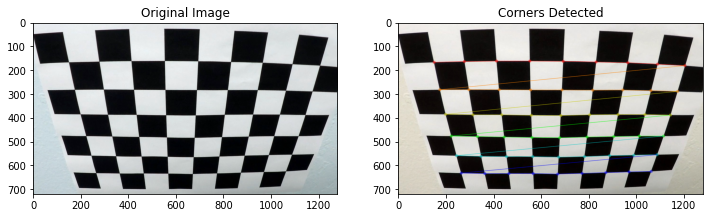

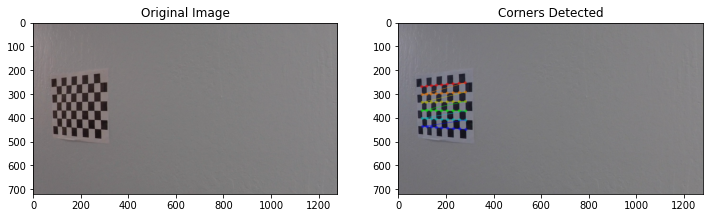

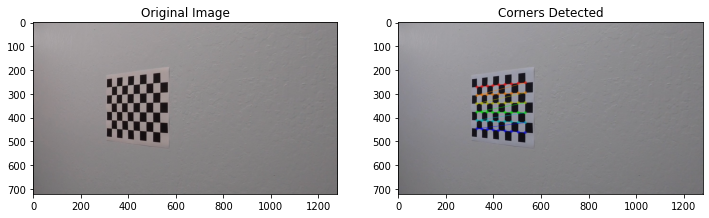

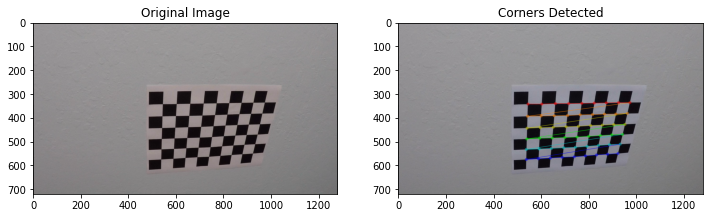

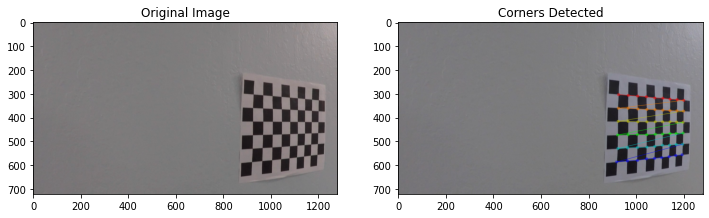

...

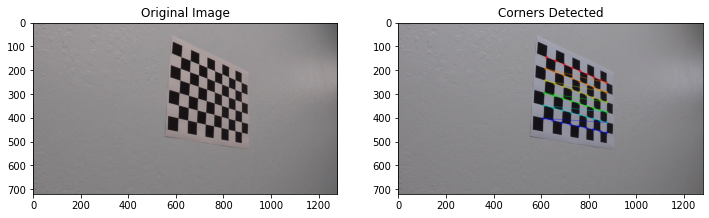

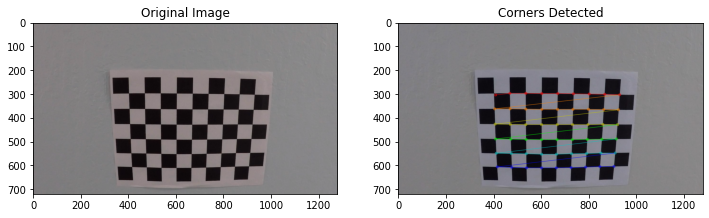

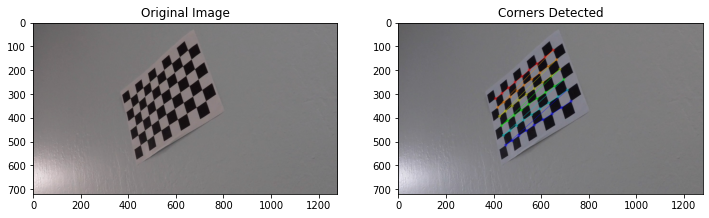

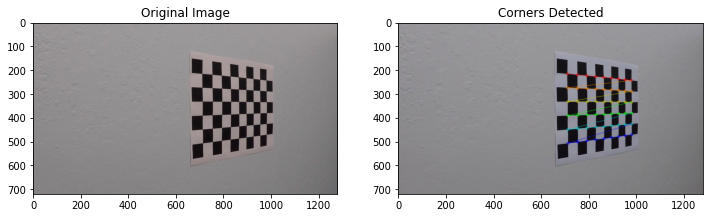

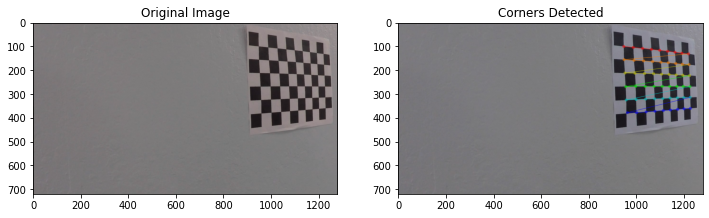

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    #convert to gray
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image')
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Corners Detected')

## 2) Apply Distortion Correction

In [3]:
def Undistorted_Images(image):
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

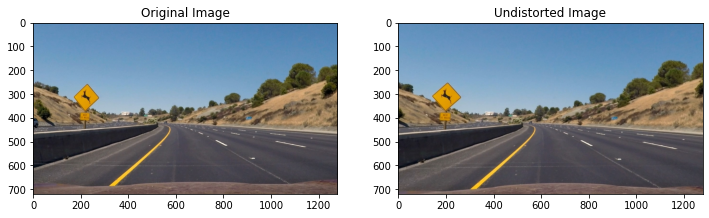

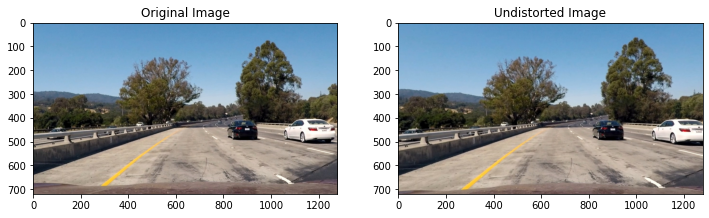

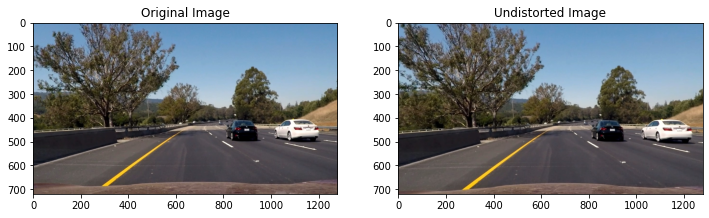

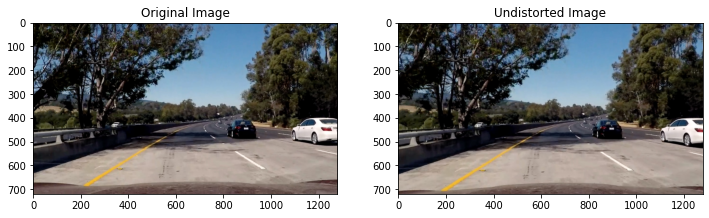

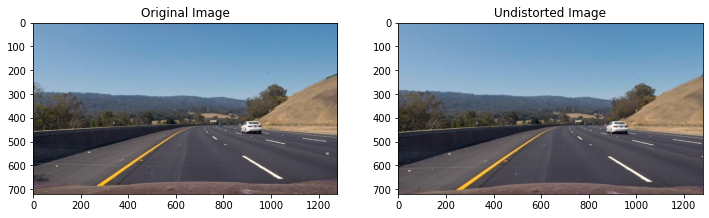

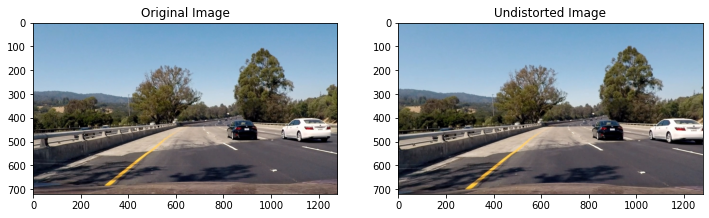

In [4]:
images = glob.glob('test_images/test*.jpg')
for img in images:
    img = cv2.imread(img)
    undistorted = Undistorted_Images(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image')

## 3) Gradient & Color Threshold
### abs_sobel_shreshold

In [5]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    HLSimg = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = HLSimg[:,:,2]
    sobelx      = cv2.Sobel(S, cv2.CV_64F, 1, 0)
    abs_sobelx  = np.absolute(sobelx)
    scaled_sobel= np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    binary_output   =np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] =1
    return binary_output

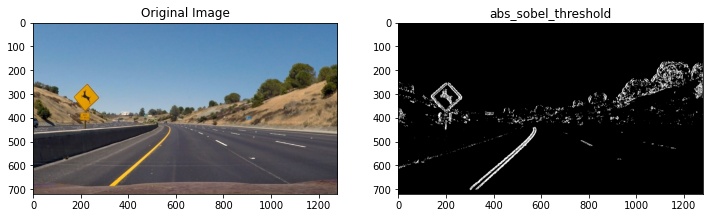

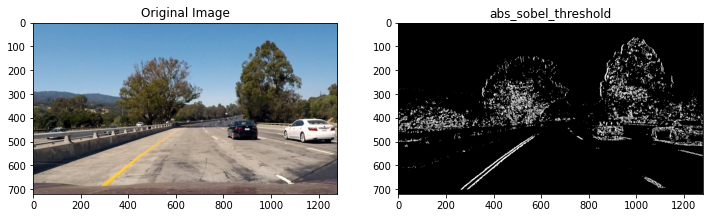

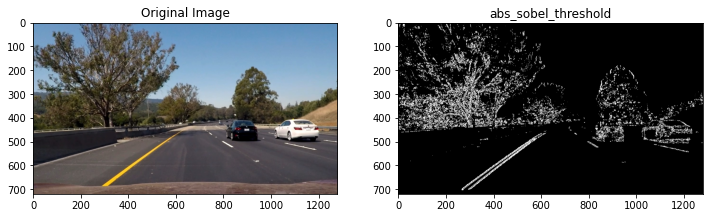

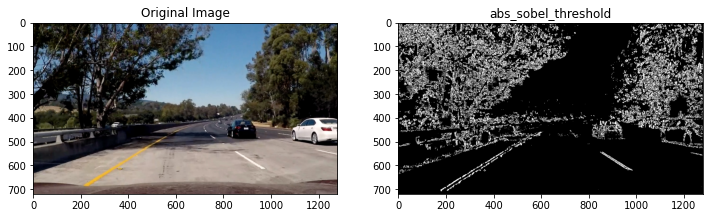

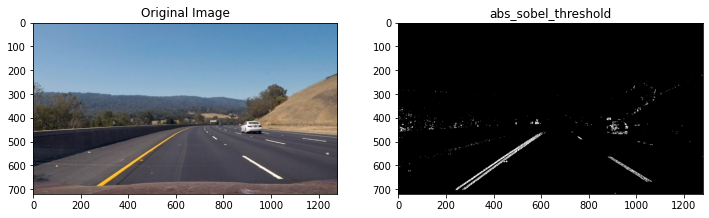

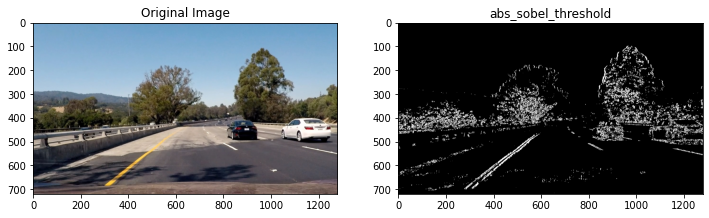

In [6]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img              = cv2.imread(image)
    undistorted      = Undistorted_Images(img)
    abs_threshold    = abs_sobel_thresh(undistorted, orient='x', thresh_min=20, thresh_max=100)

    ##Printing
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(abs_threshold, cmap='gray')
    ax2.set_title('abs_sobel_threshold')

###  Magnitude of Gradient

In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    HLSimg = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = HLSimg[:,:,2]
    sobelx       = cv2.Sobel(S, cv2.CV_64F, 1, 0, sobel_kernel)
    sobely       = cv2.Sobel(S, cv2.CV_64F, 0, 1, sobel_kernel)
    abs_sobelxy  = np.sqrt(sobelx**2+sobely**2)
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    binary_output=np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] =1
    
    return binary_output

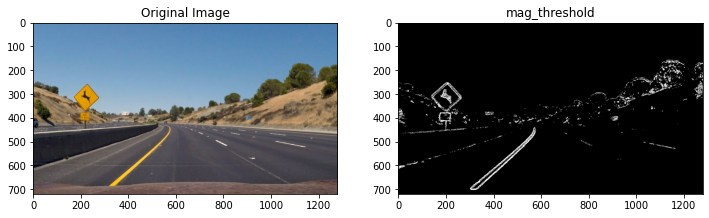

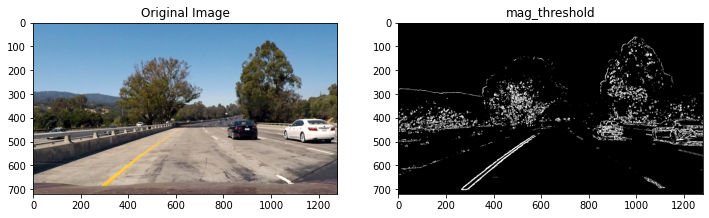

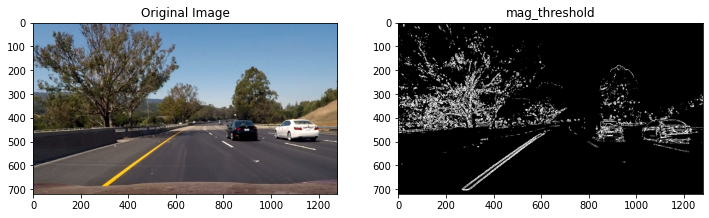

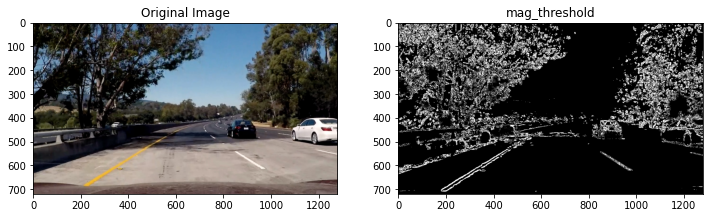

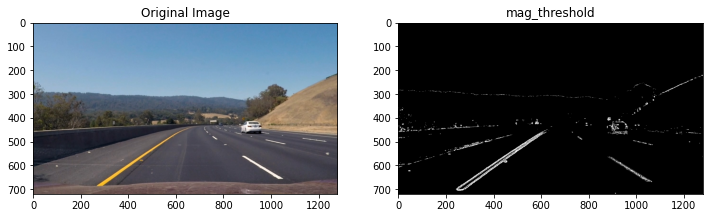

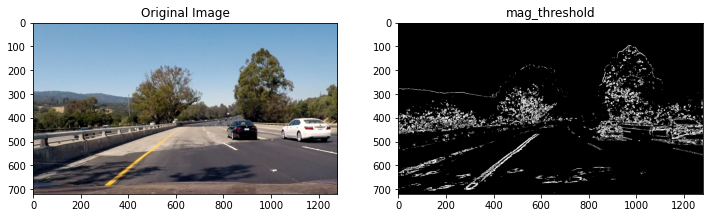

In [8]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img              = cv2.imread(image)
    undistorted      = Undistorted_Images(img)
    binary_thresh    = mag_thresh(undistorted, sobel_kernel=9, mag_thresh=(30, 100))
    ##Printing
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(binary_thresh, cmap='gray')
    ax2.set_title('mag_threshold')

### Direcotion of the gradient

In [9]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    HLSimg = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = HLSimg[:,:,2]
    sobelx        = cv2.Sobel(S, cv2.CV_64F, 1, 0, sobel_kernel)
    sobely        = cv2.Sobel(S, cv2.CV_64F, 0, 1, sobel_kernel)
    abs_sobelx    = np.absolute(sobelx)
    abs_sobely    = np.absolute(sobely)
    DirecofGrad   = np.arctan2(abs_sobely, abs_sobelx)
    binary_output =np.zeros_like(DirecofGrad)
    binary_output[(DirecofGrad >= thresh[0]) & (DirecofGrad <= thresh[1])] =1
    return binary_output

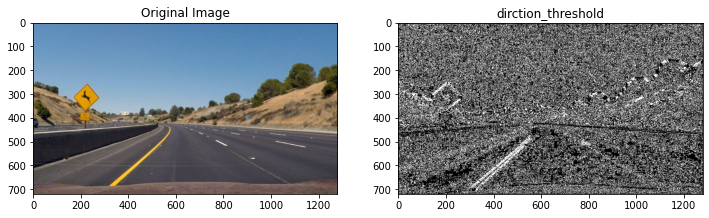

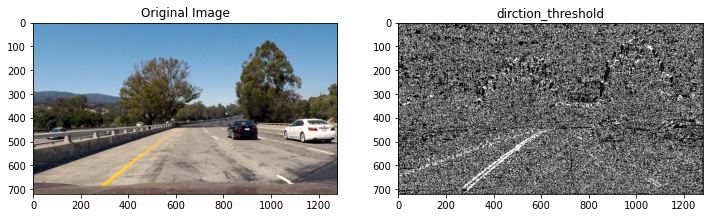

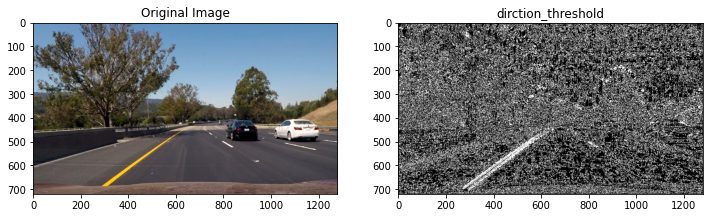

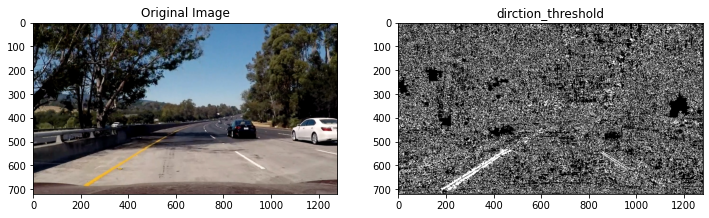

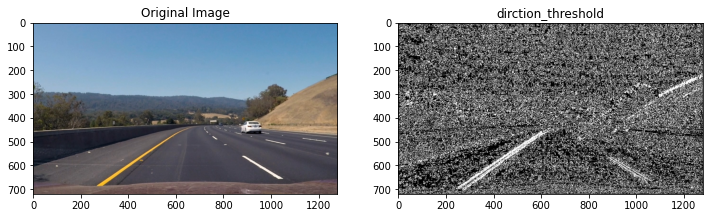

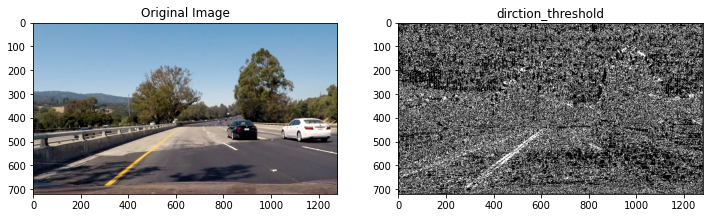

In [10]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img              = cv2.imread(image)
    undistorted      = Undistorted_Images(img)
    dir_thresh       = dir_threshold(undistorted, sobel_kernel=3, thresh=(0.7, 1.3))

    ##Printing
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(dir_thresh, cmap='gray')
    ax2.set_title('dirction_threshold')

### Combined Threshold

In [11]:
def combined_threshold(image):
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.3))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))| ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined
    

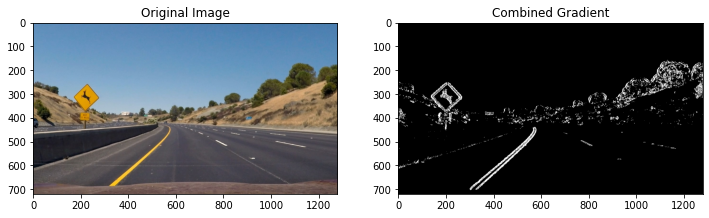

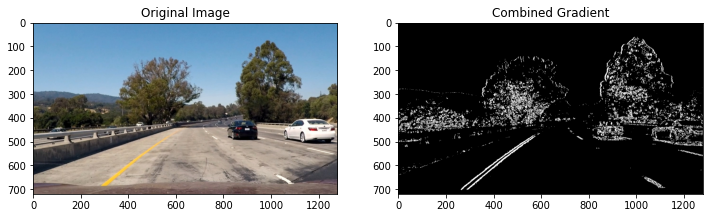

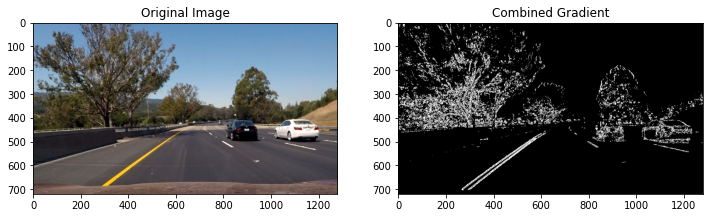

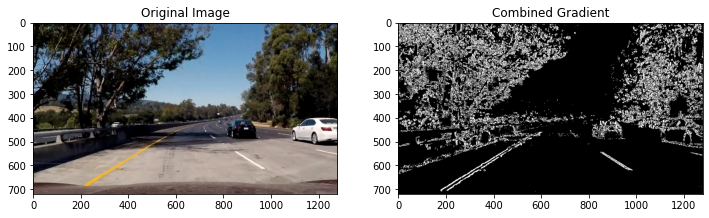

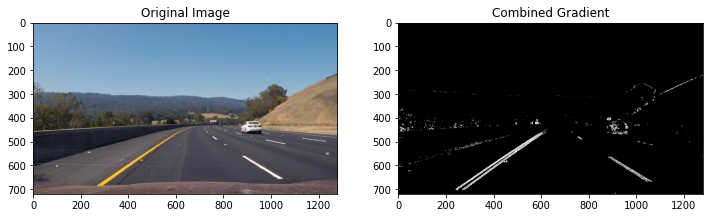

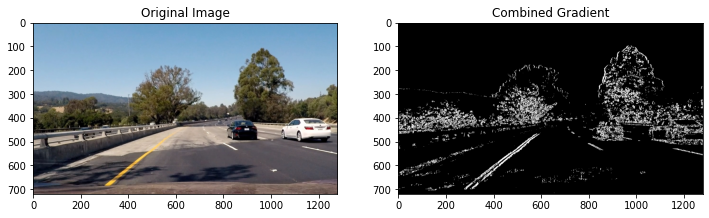

In [12]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img         = cv2.imread(image)
    undistorted = Undistorted_Images(img)
    combined    = combined_threshold(undistorted)
    ##Printing
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Combined Gradient')

## 3) Prespective Transform & Image Wrapping

In [13]:
def Image_Wrapping(image):
    height, width = image.shape[0:2]
    src = np.float32([[580.0, 460.0],
                     [740.0, 460.0],
                     [1100.0, 670.0],
                     [270.0, 670.0],])

    dst = np.float32([[200.0, 0],
                     [width - 200.0, 0],
                     [width - 200.0, height],
                     [200.0, height],])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    wrapped = cv2.warpPerspective(image, M, (width, height), flags=cv2.INTER_LINEAR)
    return wrapped, Minv
    

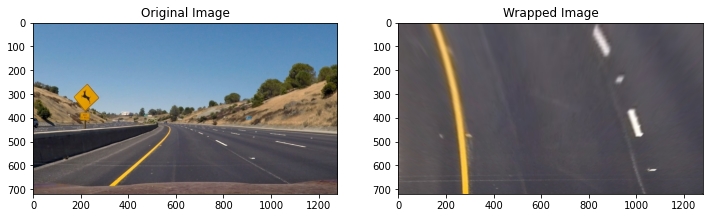

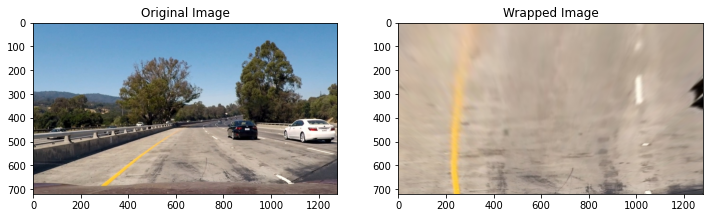

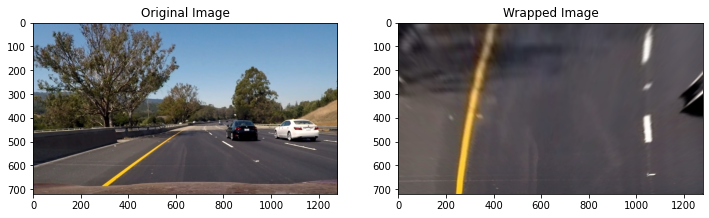

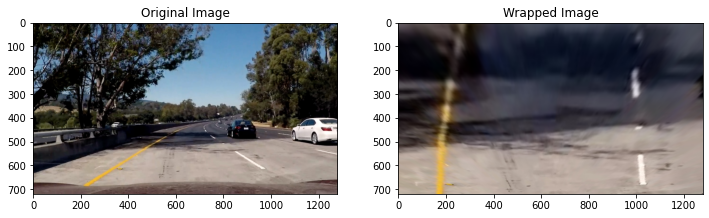

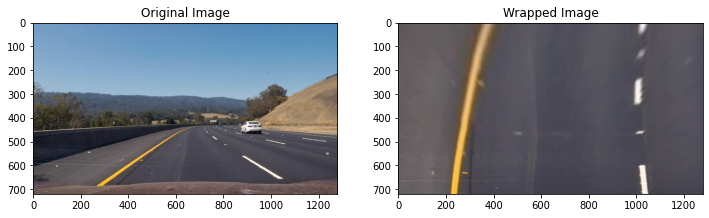

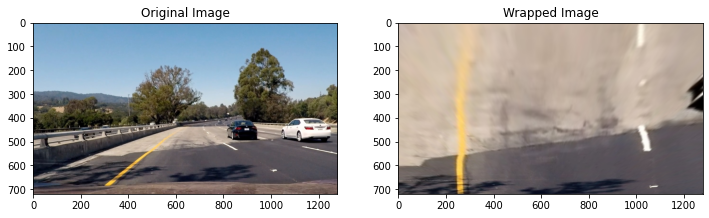

In [14]:
images = glob.glob('test_images/test*.jpg')
for img in images:
    img = cv2.imread(img)
    undistorted = Undistorted_Images(img)
    wrapped, Minv = Image_Wrapping(undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(cv2.cvtColor(wrapped, cv2.COLOR_BGR2RGB))
    ax2.set_title('Wrapped Image')

### Combining Threshold with Image wrapping

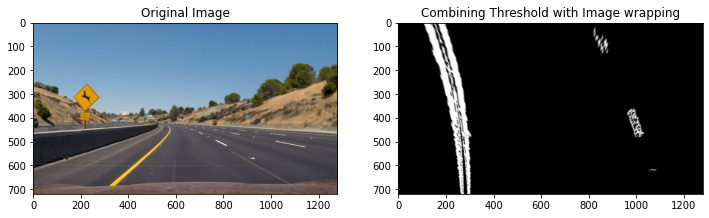

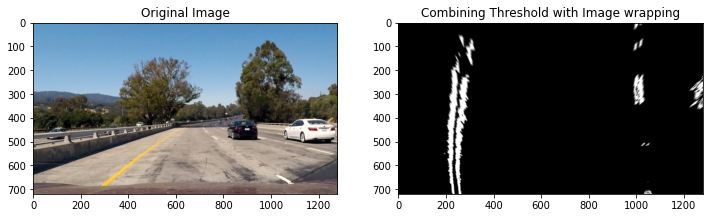

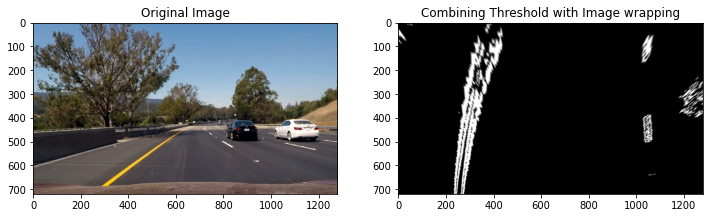

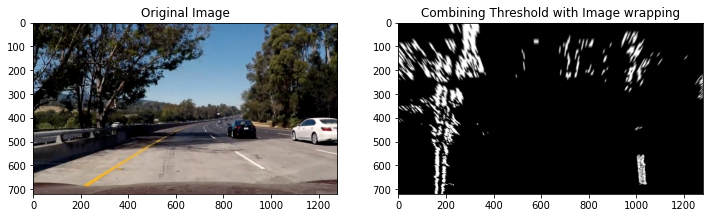

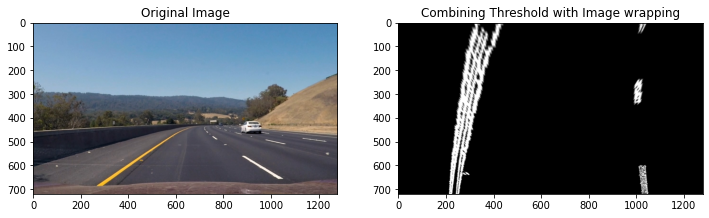

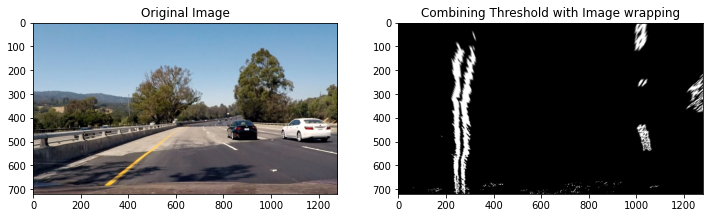

In [15]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    undistorted    = Undistorted_Images(img)
    combined       = combined_threshold(undistorted)
    binary_wrapped, Minv = Image_Wrapping(combined)
    
    ##Printing
    f, (ax1, ax2)  = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(binary_wrapped, cmap='gray')
    ax2.set_title('Combining Threshold with Image wrapping')

 ### Use Histogram to Detect Lane Lines

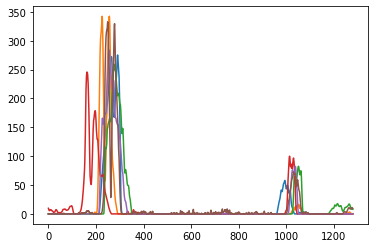

In [16]:
import numpy as np
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    undistorted    = Undistorted_Images(img)
    combined       = combined_threshold(undistorted)
    binary_wrapped, Minv = Image_Wrapping(combined)
    histogram = np.sum(binary_wrapped[binary_wrapped.shape[0]//2:,:], axis=0)
    plt.plot(histogram)

## 4) Sliding Window and find lane fitting

In [17]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    return left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


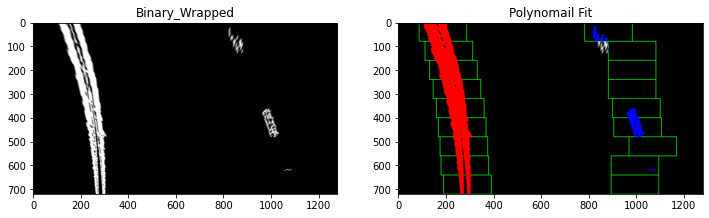

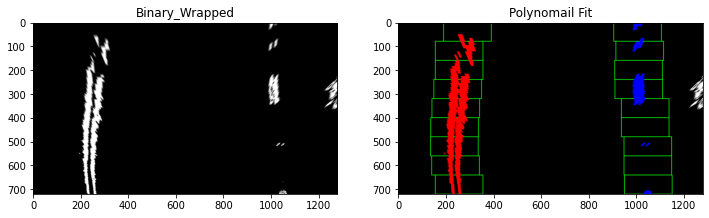

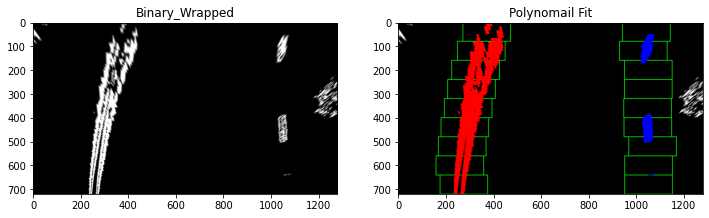

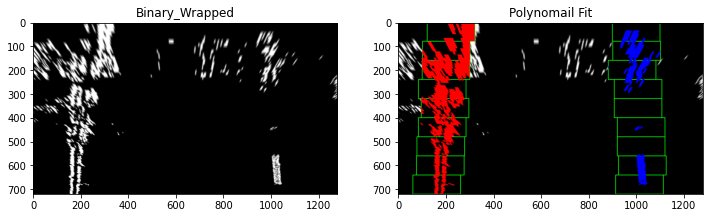

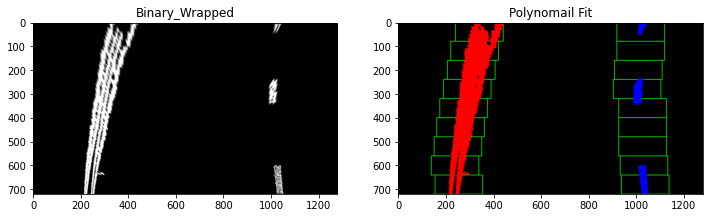

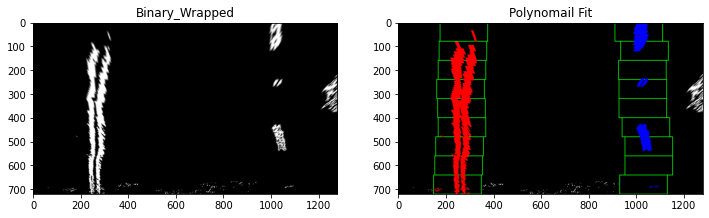

In [18]:
import numpy as np
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    undistorted    = Undistorted_Images(img)
    combined       = combined_threshold(undistorted)
    binary_warped, Minv = Image_Wrapping(combined)
    left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty = fit_polynomial(binary_warped)
    ##Printing
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    ax1.imshow(binary_warped, cmap='gray')
    ax1.set_title('Binary_Wrapped')
    ax2.imshow(out_img)
    ax2.set_title('Polynomail Fit')

## 5) Calculate lane curvature

In [19]:
def measure_curvature_pixels(ploty, left_fit, right_fit):
    y_eval = np.max(ploty)

    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    return left_curverad, right_curverad

### Test Curvature

In [20]:
##### Testing curvature
def generate_data():
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty_Test = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit_Test = np.polyfit(ploty_Test, leftx, 2)
    right_fit_Test = np.polyfit(ploty_Test, rightx, 2)
    
    return ploty_Test, left_fit_Test, right_fit_Test

# Calculate the radius of curvature in pixels for both lane lines
left_curverad, right_curverad = measure_curvature_pixels(ploty, left_fit, right_fit)

print(left_curverad, right_curverad)
# Should see values of 1625.06 and 1976.30 here, if using
# the default `generate_data` function with given seed number


9352.456730777165 3329.6772106077733


### Final Step, Draw Line.

In [21]:
def draw_green_lane(img, warped, left_fit, right_fit, ploty, left_curverad, right_curverad, Minv):
    
     # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    
    # Creating Text and set font parameters
    TextL = "Left  Curvature: " + str(int(left_curverad)) + " m"
    TextR = "Right Curvature: " + str(int(right_curverad))+ " m"
    fontScale=1.5
    thickness=3
    fontFace = cv2.FONT_HERSHEY_SIMPLEX

    # Using CV2 putText to write text into images
    cv2.putText(newwarp, TextL, (110,60), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)
    cv2.putText(newwarp, TextR, (110,110), fontFace, fontScale,(255,255,255), thickness,  lineType = cv2.LINE_AA)

    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    return result

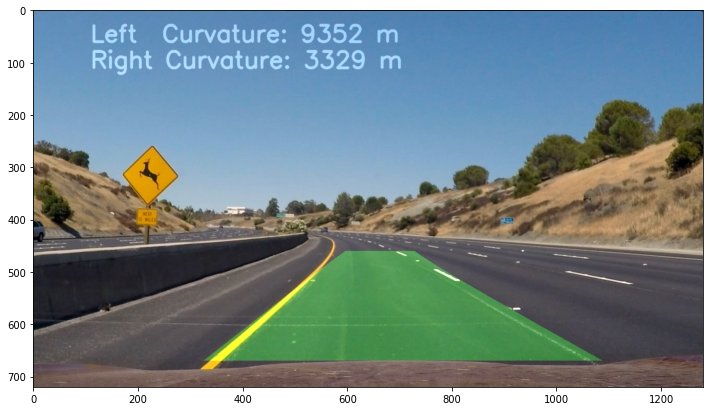

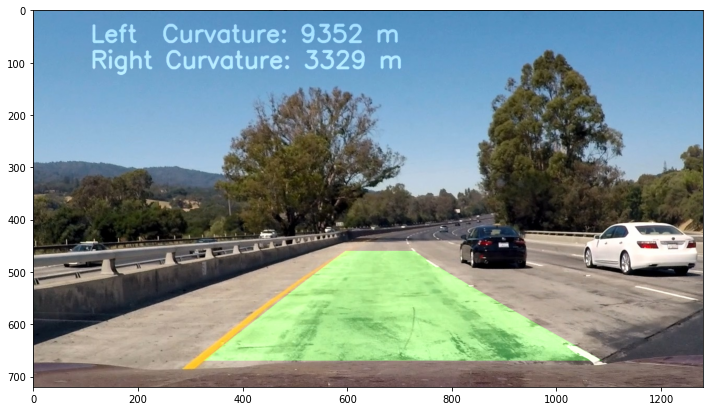

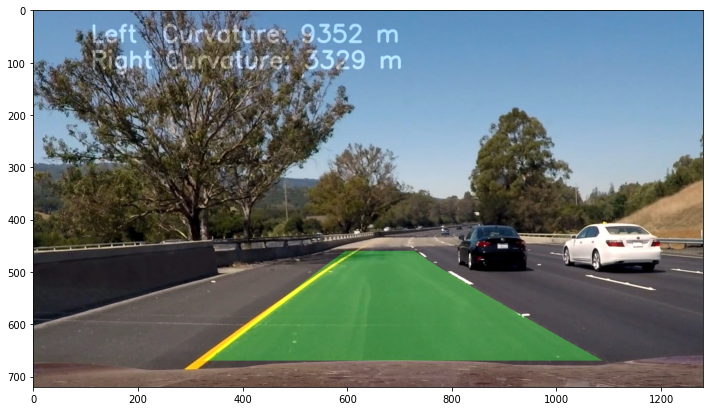

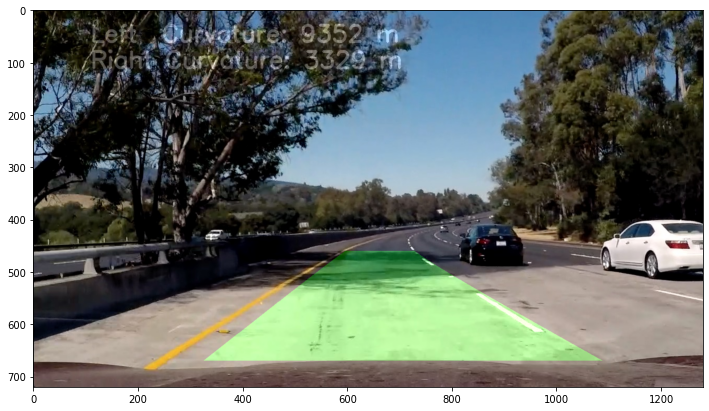

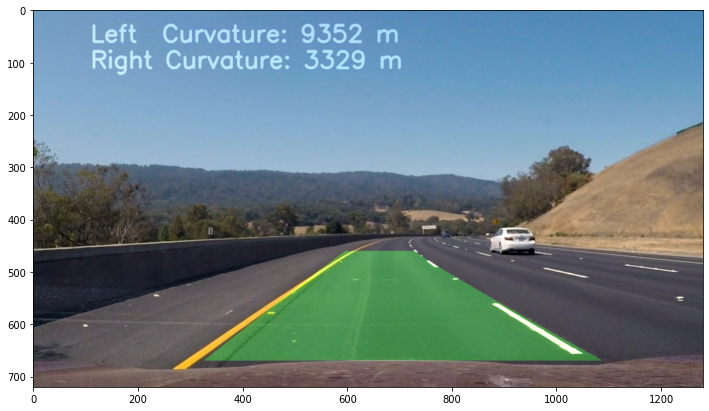

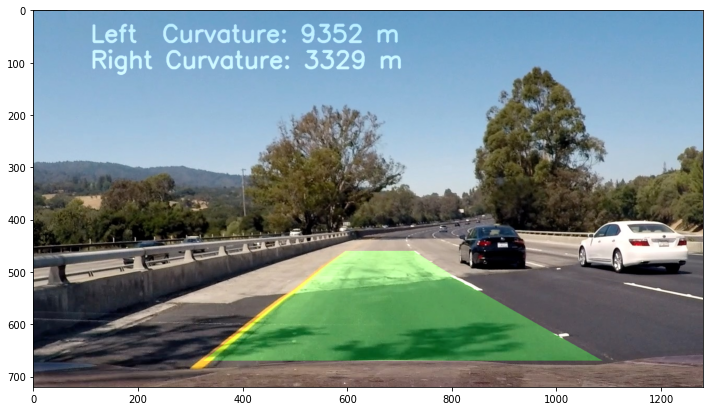

In [22]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    drawed_lane = draw_green_lane(img, binary_warped, left_fit, right_fit, ploty, left_curverad, right_curverad, Minv)
    plt.figure(figsize=(12,8))
    plt.imshow(cv2.cvtColor(drawed_lane, cv2.COLOR_BGR2RGB))
    

### Final PipeLine Form

In [23]:
def Car_Lane_Detection(img):
    undistorted    = Undistorted_Images(img)
    binary_warped, Minv = Image_Wrapping(combined)
    left_fit, right_fit,out_img, lefty, leftx, righty, rightx, ploty = fit_polynomial(binary_warped)
    green_lane = draw_green_lane(img, binary_warped, left_fit, right_fit, ploty, left_curverad, right_curverad, Minv)
    
    return green_lane

## Testing A Video

In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [25]:
#Create video file pipeline
Video_output = 'out_test_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
out_clip = clip1.fl_image(Car_Lane_Detection)
%time out_clip.write_videofile(Video_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video out_test_video.mp4.
Moviepy - Writing video out_test_video.mp4



Moviepy - Done !
Moviepy - video ready out_test_video.mp4
CPU times: user 15min 43s, sys: 4.11 s, total: 15min 47s
Wall time: 15min 8s


In [26]:
HTML("""
<video  width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(Video_output))